# Sparse Factor

Dataset FRED-MD: Monthly Data version 2024-12 (https://www.stlouisfed.org/research/economists/mccracken/fred-databases)

## Packages

In [67]:
import numpy as np
import pandas as pd
import plotly
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from src.preprocessing import apply_transformation

## Import

In [69]:
start_date = "1960"
end_date = "2024"

In [70]:
import contextlib
fred_md = pd.read_csv("data/fred_md_2024_12.csv")
fred_md_short = (
    fred_md.iloc[1:]
    .assign(sasdate=pd.to_datetime(fred_md.iloc[1:].sasdate, format="%m/%d/%Y"))
    .set_index("sasdate")
)

fred_info = pd.read_csv("data/FRED_MD_updated_appendix.csv", encoding="latin1")
fred_info.sort_values(by="group", inplace=True)
fred_info = fred_info[fred_info["fred"] != "IPB51222s"]

for _, row in fred_info.iterrows():
    series_name = row['fred']
    transformation_code = row['tcode']

    # Apply the transformation to the corresponding column in data_df
    with contextlib.suppress(Exception):
        fred_md_short[series_name] = apply_transformation(fred_md_short[series_name], transformation_code)

fred_md_short = fred_md_short[fred_info["fred"].to_list()]
fred_md_short = fred_md_short[
    (fred_md_short.index >= start_date) & (fred_md_short.index <= end_date)
].dropna(axis=1)

us_rec = pd.read_csv("data/USREC.csv")
us_rec = us_rec.assign(
    observation_date=pd.to_datetime(us_rec.observation_date)
).set_index("observation_date")
us_rec = us_rec.loc[fred_md_short.index,:]

## Plot

In [62]:
fred_md_short.plot(backend="plotly")

In [63]:
us_rec.plot(backend="plotly")

## Normalize

In [64]:
fred_md_normal = fred_md_short.apply(lambda col: (col - col.mean()) / (col.std()))

In [65]:
fred_md_normal.plot(backend="plotly")

## PXL-EM 

In [71]:
from src.pxl_em import *

In [85]:
num_factor = 8
num_obs, num_var = fred_md_normal.shape

Y = fred_md_normal.to_numpy().T
B0 = np.random.rand(num_var, num_factor)
Sigma0 = np.array(num_var*[1.])
Theta0 = np.array(num_factor * [0.5])

B, Sigma, Theta, Omega = map_estimation(B0, Sigma0, Theta0, Y, alpha=1/num_var, lambda0=1, lambda1=0.001, convergence_criterion=0.01)

PXL-EM: 100%|██████████| 500/500 [06:15<00:00,  1.33iter/s, error=0.11429]


## Loadings

Text(0.5, 1.0, 'Heatmap de la Matrice')

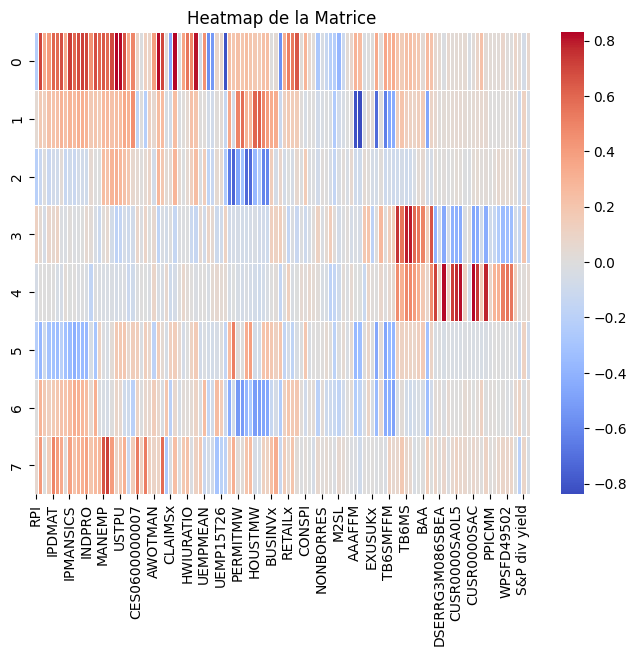

In [86]:
Loadings = pd.DataFrame(data=B.T, columns=fred_md_short.columns)

# Création de la heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(Loadings, cmap="coolwarm", linewidths=0.5)

# Ajouter un titre
plt.title("Heatmap de la Matrice")

## Factors

In [87]:
sparse_factor = pd.DataFrame(data=Omega.T, index=fred_md_normal.index)
df_merged = pd.concat([sparse_factor, us_rec], axis=1)

In [88]:
df_merged.plot(backend="plotly")